<center> <h1> <b>BIRDSONGS<b></h1> </center>
<center> <h1>Birdsong Tutorial</h1> </center>

# Define Objects

In [1]:
# the following line enable interact with figures, 
# you can make zoom and save images from a poup matplotlib window
#notebook qt ipympl tk qt
%matplotlib ipympl

import birdsongs as bs
from birdsongs.utils import *

Define Path and Ploter objects

In [2]:
# root_path   = "path_to_repository\\'
# audios_path = "audios_path\\'
# bird_name   = "Zonotrichia capensis"
audios_path = "C:\\Users\\sebas\\Documents\\GitHub\\audios\\Dissertation-xeno\\"

paths  = bs.Paths(audios_path=audios_path)              # root_path, audios_path, bird_name
ploter = bs.Ploter(save=True)   # to save figures save=True 
# paths.data

Define, visualize and hear a birdsong object from the file number of the previous table

C:\Users\sebas\anaconda3\lib\site-packages\maad\sound\input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)


The son has 13 syllables


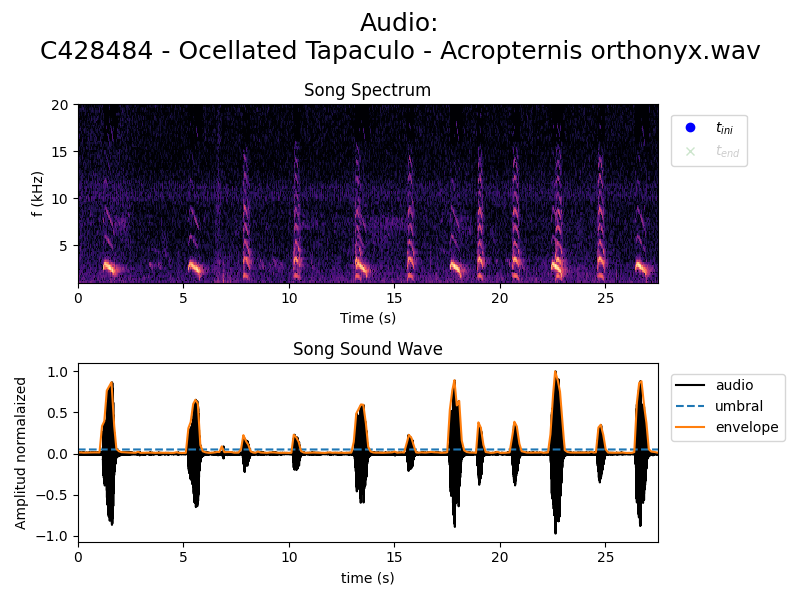

In [3]:
# no_file = int(input("Enter the number of song (0 to {0}): ".format(paths.no_files)))
birdsong = bs.BirdSong(paths, no_file=6, Nt=5000, NN=256, flim=(1e3,20e3), tlim=(0,30),
                       umbral=0.05,  split_method="amplitud")
ploter.Plot(birdsong, FF_on=False, SelectTime_on=True)
AudioPlay(birdsong)

Select interval time points

Save and show interval time points

In [4]:
time_intervals = Positions(ploter.klicker)
# time_intervals = np.array([[ 1.18588523,  1.73037226],
#                            [ 5.22438821,  5.76216342],
#                            [17.61703819, 18.14844708],
#                            [26.41765303, 26.94541381]])
print("You have selected {} syllables.".format(time_intervals.shape[0]))
[print(r"  - Syllable {}: t0 = {:.4f} s , tend = {:.4f} s".format(i, time_intervals[i,0], time_intervals[i,1])) for i in range(time_intervals.shape[0])];

You have selected 1 syllables.
  - Syllable 0: t0 = 1.1825 s , tend = 1.7248 s


Define, solve and plot a single syllable from the previous syllables defined

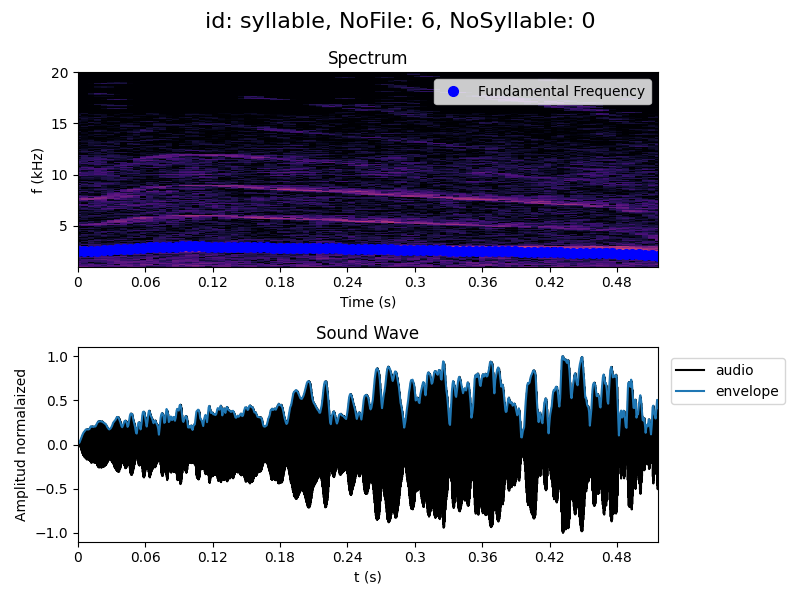

Wall time: 6.42 s


In [5]:
%%time
syllable = bs.Syllable(birdsong, tlim=time_intervals[0], ide="syllable",
                       umbral_FF=0.05, Nt=30,  flim=(1e3,20e3))
ploter.Plot(syllable, FF_on=True)
AudioPlay(syllable)

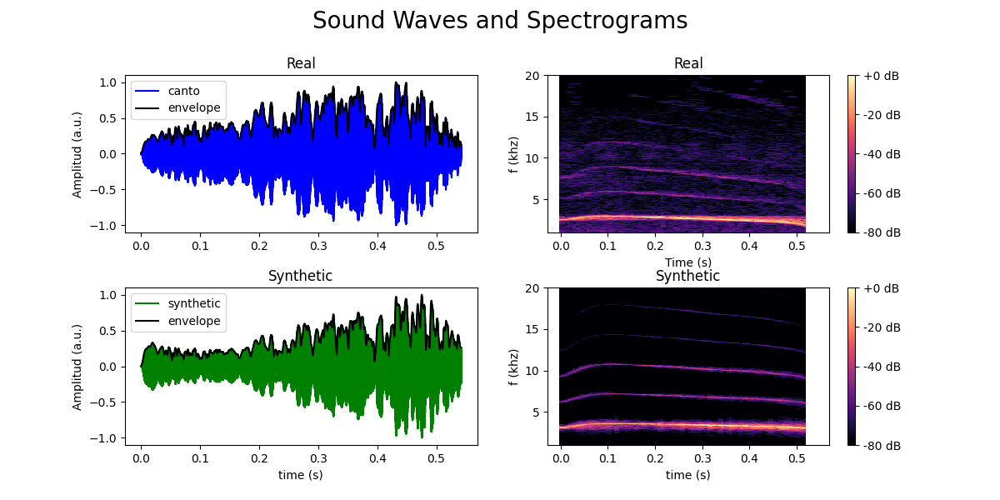

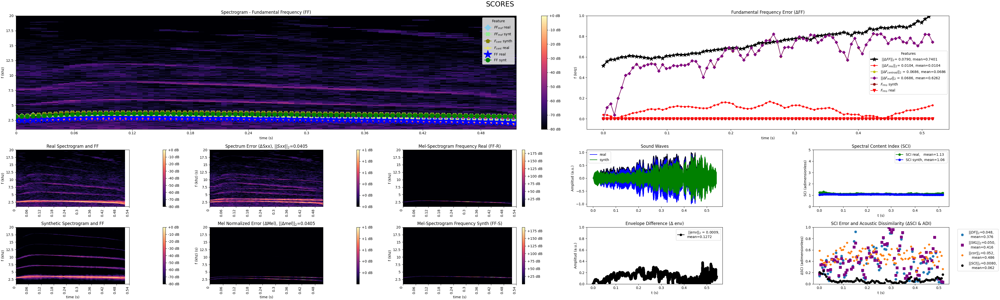

In [6]:
syllable_synth = syllable.Solve(syllable.p)
ploter.Syllables(syllable, syllable_synth)
# ploter.PlotVs(syllable_synth)
# ploter.PlotAlphaBeta(syllable_synth)
ploter.Result(syllable, syllable_synth)
AudioPlay(syllable_synth)

# Optimization
Define the optimizer object

In [7]:
method_kwargs = {'method':'brute', 'Ns':21} 
optimizer     = bs.Optimizer(birdsong, method_kwargs=method_kwargs)

Generate the whole synthetic birdsongs defined by the previous time intervals

In [8]:
birdsong, synth_birdsong = optimizer.SongByTimes(time_intervals, NN=256)

Looking for optial time scale constant (γ*)
Syllable 1/1
[1.1824903  1.72477201]


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try incre

γ* =  37000, t=6.8359 min
γ found 37000.0 over 1 syllables. Time of execution 6.9534 min
Start syllables optimization
Syllable 1/1


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)


As


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try incre

$a_0*$=0.1060, t=6.7234 min


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try incre

$a_1*$=0.0000, t=6.9364 min
Bs


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try incre

$b_0*$=-0.1000,
b_2*=0.2000, t=65.8249 min


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try incre

$b_1*$=1.0000, t=6.8252 min
end
Time of execution = 86.3099 minutes


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\core\spectrum.py:620: RuntimeWarning: invalid value encountered in divide
  correction = -np.imag(S_dh / S_h)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\core\spectrum.py:793: RuntimeWarning: invalid value encountered in divide
  correction = np.real(S_th / S_h)
C:\Users\sebas\Documents\GitHub\birdsongs\birdsongs\syllable.py:113: RuntimeWarning: invalid value encountered in double_scalars
  self.f_msf   = np.array([Norm(self.FF_coef[:,i]*self.freq, 1)/Norm(self.FF_coef[:,i], 1) for i in range(self.FF_coef.shape[1])])


Optimal parameters found. The time of execution was 1.4655 hours


In [9]:
optimizer.ps[0]

name,value,initial value,min,max,vary
a0,0.10600000,0.11,0.01000000,0.25000000,False
a1,0.00000000,0.05,-2.00000000,2.00000000,False
a2,0.00000000,0.0,0.00000000,2.00000000,False
b0,-0.10000000,-0.1,-1.00000000,0.50000000,False
b1,1.00000000,1,0.00000000,2.00000000,False
b2,0.20000000,0.0,0.00000000,2.00000000,False
gm,37000.0000,40000.0,10000.0000,100000.000,False


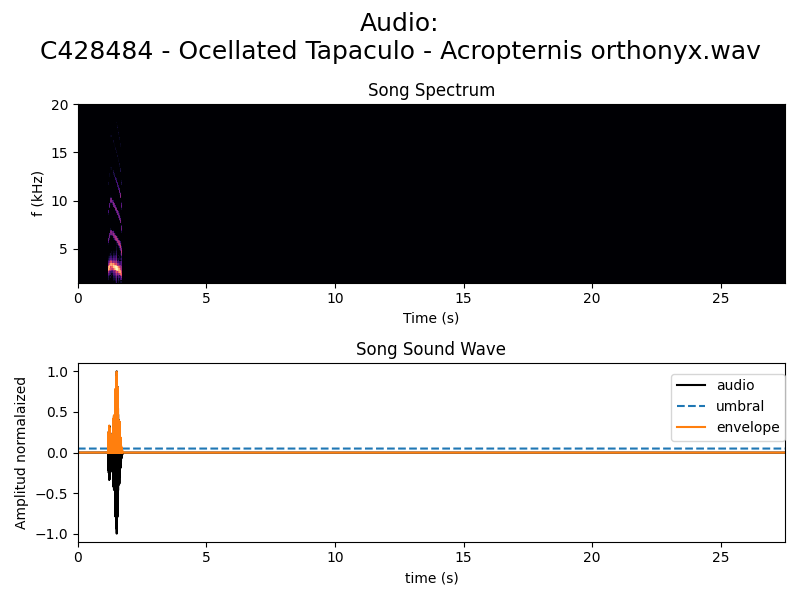

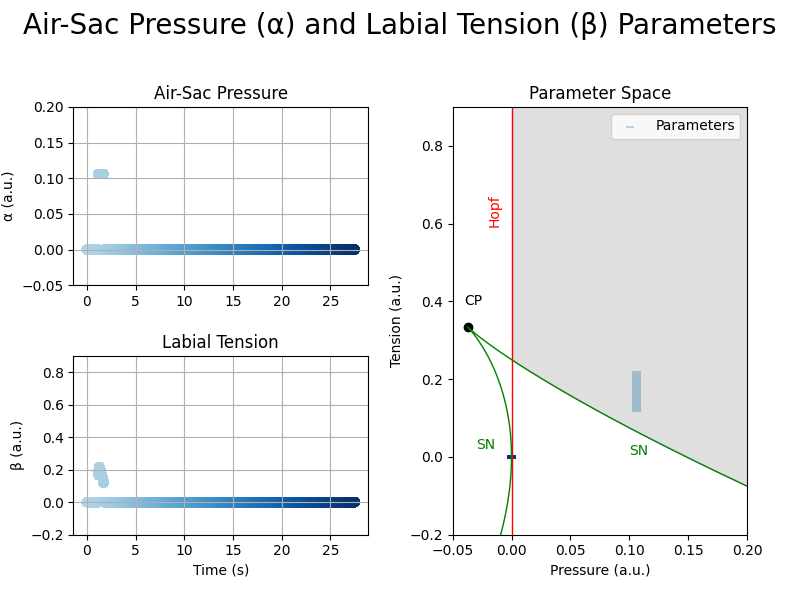

AttributeError: 'Ploter' object has no attribute 'Vs'

In [18]:
ploter.Plot(synth_birdsong)
ploter.PlotAlphaBeta(synth_birdsong)

AudioPlay(synth_birdsong)

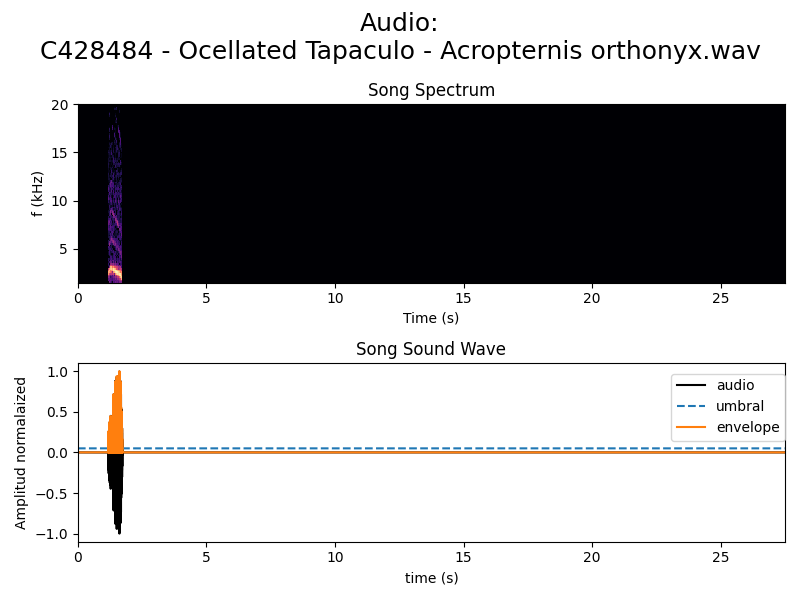

In [14]:
ploter.Plot(birdsong)
AudioPlay(birdsong)

In [ ]:
AudioPlay(syllable)

In [ ]:
birdsong.no_syllable = 1
ploter.Syllables(birdsong, synth_birdsong);

Visualize and hear the whole synthetic birdsong

In [ ]:
# %%time
# synth_bird = synth_birdsong.SolveAB(synth_birdsong.alpha, synth_birdsong.beta, 3700)
# # synth = SolveAB(syll, synth_birdsong.alphas, synth_birdsong.betas, 3700)

AttributeError: 'Syllable' object has no attribute 'deltaFF'

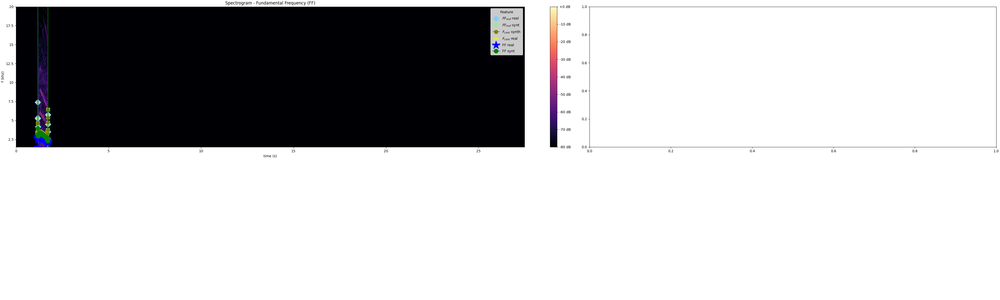

In [17]:
synth_birdsong.id = "synth-birdsong"
ploter.Result(birdsong, synth_birdsong)
ploter.PlotVs(synth_bird)
AudioPlay(synth_bird)

Save the real and synthetic birdsongs as audio WAV files

In [15]:
birdsong.WriteAudio(); 
synth_birdsong.WriteAudio();

C:\Users\sebas\anaconda3\lib\site-packages\maad\sound\input_output.py:390: UserWarning: Values for bit depth should be 8, 16 or 32. Argument ignored.
  warn('Values for bit depth should be 8, 16 or 32. Argument ignored.')


In [ ]:
# optimizer.SmoothAB(time_intervals)

# plt.figure()
# # plt.plot(synth_birdsong.time_s, synth_birdsong.betas_smooth, 'o', ms=2, label="beta smooth")
# # plt.plot(synth_birdsong.time_s, synth_birdsong.alphas_smooth, 'o', ms=1, label="alpha smooth")

# plt.plot(synth_birdsong.time_s, synth_birdsong.betas, 'o', ms=2, label="betas")
# plt.plot(synth_birdsong.time_s, synth_birdsong.alphas, 'o', ms=1, label="alpha")

# plt.xlim((0,2.6)); plt.legend()
# plt.show()